<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ вакансий на hh.ru
   

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from ipywidgets import HTML
from IPython.display import display


pd.set_option('display.max_columns', 40) # выводить больше столбцов
pd.set_option('display.max_rows', 10)   # выводить больше строк
plt.style.use('default')    # корректный вывод графиков в темной теме 

# data set link: https://drive.google.com/file/d/1Kb78mAWYKcYlellTGhIjPI-bCcKbGuTn/view?usp=sharing

# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

In [3]:
#ваш код здесь
hh_df1 = pd.read_csv('data/hh_database.csv', sep= ';')

2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [4]:
hh_df = hh_df1.copy()
hh_df.tail()

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
44739,"Мужчина , 30 лет , родился 17 января 1989",50000 руб.,"Финансист, аналитик, экономист, бухгалтер, мен...","Тверь , готов к переезду (Москва, Химки) , гот...",полная занятость,"полный день, удаленная работа","Опыт работы 7 лет 7 месяцев Финансист, аналит...","ООО ""IAS"" (независимый участник объединения Ru...",Руководитель субгруппы,Высшее образование 2015 Московский гуманитарн...,22.04.2019 12:32,Не указано
44740,"Мужчина , 27 лет , родился 5 марта 1992",39000 руб.,"Системный администратор, IT-специалист","Липецк , готов к переезду , готов к командировкам","проектная работа, частичная занятость, полная ...","удаленная работа, гибкий график, полный день, ...","Опыт работы 7 лет Системный администратор, IT...",ИП Пестрецов,Предприниматель,Высшее образование (Бакалавр) 2016 Воронежски...,22.04.2019 13:11,Не указано
44741,"Женщина , 48 лет , родилась 26 декабря 1970",40000 руб.,"Аналитик данных, Математик","Челябинск , готова к переезду , готова к редки...",полная занятость,"полный день, удаленная работа",Опыт работы 21 год 5 месяцев Январь 1998 — по...,"ОАО «ЧМК», Исследовательско-Технологический Це...",Начальник группы аналитики,Высшее образование 2000 Южно-Уральский госуда...,09.04.2019 05:07,Не указано
44742,"Мужчина , 24 года , родился 6 октября 1994",20000 руб.,Контент-менеджер,"Тамбов , не готов к переезду , не готов к кома...","частичная занятость, полная занятость",удаленная работа,Опыт работы 3 года 10 месяцев Контент-менедже...,IQ-Maxima,Менеджер проектов,Высшее образование 2015 Тамбовский государств...,26.04.2019 14:25,Имеется собственный автомобиль
44743,"Мужчина , 38 лет , родился 25 апреля 1980",120000 руб.,Руководитель проекта,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 15 лет 10 месяцев Руководитель пр...,ПАО ГК ТНС энерго,Руководитель отдела технической поддержки,Высшее образование 1997 Южно-Российский госуд...,05.07.2018 20:15,Не указано


3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

In [5]:
display(hh_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

None

4. Обратите внимание на информацию о числе непустых значений.

In [6]:
display(hh_df.shape)

(44744, 12)

5. Выведите основную статистическую информацию о столбцах.


In [7]:
display(hh_df.describe())

for column in hh_df.columns:
    if hh_df[column].nunique() < 50:
        hh_df[column] = hh_df[column].astype('category')


,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 1987 Военный инженерный Кра...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [8]:
hh_df['Образование'] = hh_df['Образование и ВУЗ'].apply(lambda x : x.split(sep=' ')[0] +' '+ x.split(sep=' ')[1]).astype('category') #берем строку, разделяем по пробелам забираем 0 и 1 элемент, складываем
hh_df['Образование'].value_counts() #проверка результата

Высшее образование     33863
Среднее специальное     5765
Неоконченное высшее     4557
Среднее образование      559
Name: Образование, dtype: int64

2. Теперь нас интересует столбец **"Пол, возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [9]:

hh_df['Пол'] = hh_df['Пол, возраст'].apply(lambda x : x.split(sep=' ')[0]).astype('category') # new column Gender # Выделяем пол в отдельный признак
display(round(hh_df['Пол'].value_counts(normalize=True)*100, 2)) # гендерный состав соискателей



def period_from_str(string_with_year, period = 'year', start_pos = 0, end_pos = np.Infinity, separator=' '):
    ''' for calculation length of period  in years or monthes where source is a string'''
    ''' для калькулирования длительности периода  в годах или месяцах, когда источник дан в формате строки типа "число лет"  '''
    
    hidden_NaN_list = ['Не указано', 'NaN', 'nan','Nan', np.nan,' '] # to check if any hidden NaN in the data
    
    if string_with_year in hidden_NaN_list:  # checking current quality of the string проверяем переданную строку на наличие пропусков явных или скрытых
        return np.nan
    
    string_to_list = list(str(string_with_year).split(sep=separator))
    
    if end_pos == np.Infinity:
        end_pos = len(string_to_list)
    if start_pos < end_pos:# data check & preparation проверка данных и предварительная подготовка строки
        cutted_list = string_to_list[start_pos:end_pos] 
    else:
        raise Exception('start_pos can be equel or lower the end_pos')
    
 
    def calculating_monthes(cutted_list):
        year_word_list = ['лет', 'года','год']
        month_word_list = ['месяца', 'месяцев','месяц']

        for line in hh_df.index: #
            month_to_month = 0
            year_to_month = 0 
            total_monthes = 0 
            for element in range(len(cutted_list)):
                if cutted_list[element] in year_word_list: #finding years 
                    year_to_month += int(cutted_list[element-1])*12 # calculating monthes
                if cutted_list[element] in month_word_list: # finding monthes
                    month_to_month += int(cutted_list[element-1]) 
                total_monthes = year_to_month + month_to_month #total age in monthes
            return total_monthes #age 
    
    if period == 'year': # output in years
        years = int(calculating_monthes(cutted_list) / 12)
        return years
    
    elif period == 'month': # output in monthes
        monthes = int(calculating_monthes(cutted_list))
        return monthes
    
    else:
        raise Exception('This function support only -year and -month argument so far')
        return None
    
        
        
hh_df['Возраст'] = hh_df['Пол, возраст'].apply(lambda x: period_from_str(x, period='year')) # New column Age Выделяем возраст в отдельный признак 

mean_age = round(hh_df['Возраст'].mean(), 1)

print(f'Средний возраст соискателей равен {mean_age} года.')  # возрастной состав соискателей средний возраст

Мужчина    80.93
Женщина    19.07
Name: Пол, dtype: float64

Средний возраст соискателей равен 32.2 года.


3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [10]:

hh_df['Опыт работы (месяц)'] = hh_df['Опыт работы'].apply(lambda x: period_from_str(x, period='month', start_pos= 0, end_pos=6))

median_expirience = round(hh_df['Опыт работы (месяц)'].median()) 
print(f'Медианный опыт работы соискателей равен {median_expirience} месецев.')  # median working expirience 

Медианный опыт работы соискателей равен 100 месецев.


In [11]:
del hh_df['Опыт работы'] # очень осторожно

4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готова к редким командировкам , …
    * … , готов к командировкам , … 
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [12]:
def define_city(str_city):
    ''' выбираем город из строковой переменной только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие"'''
    hidden_NaN_list = ['Не указано', 'NaN', 'nan','Nan', np.nan,' '] # to check if any hidden NaN in the data
    
    if str_city in hidden_NaN_list:  # checking current quality of the string проверяем переданную строку на наличие пропусков явных или скрытых
        return np.nan

    million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    main_cities = ['Москва', 'Санкт-Петербург']

    city = list(str(str_city).split(sep=','))[0].replace(' ', '')

    if city in main_cities: # если Москва или Питер возвращает их обратно
        return city
    elif city in million_cities: # если города из списка то возвращает "город-миллионик"
        return 'город-миллионник'
    else:
        return 'другие'# все остальные города получают категорию "другие"
   
hh_df['Город'] = (hh_df['Город, переезд, командировки'].apply(define_city)).astype('category') # Выделение признака город 4 категории:[ "Москва", "Санкт-Петербург" , "город-миллионник", "другие"]

def ready_for_relocation(str_with_intent):
    ''' выделение признака готовности к релокации'''
    prepared_list = list(str(str_with_intent).replace(' , ', ',').split(sep=','))
    intent = ['не готов к переезду', 'не готова к переезду']
    if list(set(prepared_list) & set(intent)): # список созданый из пересечения 2х множеств, если пусто то готов к переезду если есть пересечение то нет
        return False
    else:
        return True

hh_df['Готовность к переезду'] = (hh_df['Город, переезд, командировки'].apply(ready_for_relocation)).astype('bool')# создание признака готовность к переезду


def ready_for_btrip(str_with_intent):
    ''' выделение признака готовности к коммандировкам'''
    prepared_list = list(str(str_with_intent).replace(' , ', ',').split(sep=','))
    intent = ['не готова к командировкам', 'не готов к командировкам']
    if list(set(prepared_list) & set(intent)): # список созданый из пересечения 2х множеств, если пусто то готов к командировкам если есть пересечение то нет
        return False
    else:
        return True
    
hh_df['Готовность к командировкам'] = (hh_df['Город, переезд, командировки'].apply(ready_for_btrip)).astype('bool') # создание признака готовность к командировкам

# Задание 3.4
# Сколько процентов соискателей живут в Санкт-Петербурге? Ответ округлите до целого
Sankt_percent = round(int((hh_df['Город'].value_counts(normalize=True)*100)['Санкт-Петербург']), 0)
print(f'В Санкт-Петербурге живут {Sankt_percent} % соискателей')

# Сколько процентов соискателей готовы одновременно и к переездам, и к командировкам? Ответ округлите до целого.
ready_btrip = round((hh_df['Готовность к переезду'] & hh_df['Готовность к командировкам']).mean()*100)
print(f'{ready_btrip} % соискателей готовы к командировкам.')

В Санкт-Петербурге живут 11 % соискателей
32 % соискателей готовы к командировкам.


5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [13]:

def one_hot_encoding(df, column_name):
    ''' разложение колонки с несколькими признаками на состовляющие с маячком True/False'''
        
    def clear_wrong_spaces(str_with_spaces):
        ''' убираем пробелы после запятой'''
        clear_string = str(str_with_spaces).replace(', ', ',')
        return clear_string
    
    def define_attributes(df, column_name):
        ''' создание списка признаков, по которым будет разложена изначальная колонка '''
        set_of_attributes = set()
        
        for line in df[column_name].index:
            set_of_attributes = set_of_attributes | set(list(df.loc[line, column_name].split(sep=','))) # удалим лишние пробелы
        return list(set_of_attributes)
    
    def check_status(string_of_attributes, status):
        
        if list({status} & set(string_of_attributes.split(sep=','))):
            return True
        else:
            return False
       
    df[column_name] = df[column_name].apply(clear_wrong_spaces) # очистка от лишних пробелов
    
    list_of_attributes = define_attributes(df = df, column_name=column_name) # делаем список атрибутов
    
    for column in list_of_attributes:
        df[column] = df[column_name].apply(check_status, status=column).astype('bool') # проверка статуса, проставление True/False
    
    return df

hh_df = one_hot_encoding(hh_df, column_name='Занятость')
hh_df = one_hot_encoding(hh_df, column_name='График')

# Задание 3.5
# Сколько людей ищут проектную работу или волонтёрство (в обоих столбцах стоит True)?
project_volontire = (hh_df['проектная работа'] & hh_df['волонтерство']).sum()
print(f'{project_volontire} соискателей ищут проектную работу или волонтёрство(в обоих столбцах стоит True).')

# Сколько людей хотят работать вахтовым методом или с гибким графиком (в обоих столбцах стоит True)?
flyin_flyout_flex = (hh_df['вахтовый метод'] & hh_df['гибкий график']).sum()
print(f'{flyin_flyout_flex} соискателей хотят работать вахтовым методом или с гибким графиком (в обоих столбцах стоит True).')

436 соискателей ищут проектную работу или волонтёрство(в обоих столбцах стоит True).
2311 соискателей хотят работать вахтовым методом или с гибким графиком (в обоих столбцах стоит True).


6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.

In [14]:
ex_rate = pd.read_csv('data/ExchangeRates.csv')

# готовим таблицу соотвествия названий валют в нашей базе и ISO стандарта

data = [['грн','UAH', 10,'гривна'],
        ['USD','USD', 1,'доллар'],
        ['EUR','EUR', 1,'евро'],
        ['белруб','BYN', 1,'белорусский рубль'],
        ['KGS','KGS', 10,'киргизский сом'],
        ['сум','UZS', 10000,'узбекский сум'],
        ['AZN','AZN', 1,'азербайджанский манат'],
        ['KZT','KZT', 100,'казахстанский тенге'],] 
columns = ['data_name','iso_name','пропорция','наименование'] # названия колонок 1.Название используемое в нашей базе 2. название в соотвествии с ISO стандартом, 3 пропорция пересчета 4. название в русском языке
index = range(8)

sub_ex_rate = pd.DataFrame(data, index, columns) # собираем датафрейм
display(sub_ex_rate)

hh_df['ЗП_сумма'] = hh_df['ЗП'].apply(lambda x: x.split(sep=' ')[0]).astype('int') # выделяем сумму зарплаты
hh_df['ЗП_валюта'] = hh_df['ЗП'].apply(lambda x: x.replace('.', '').split(sep=' ')[1]).astype('category') # выделяем валюту (убираем точки)

hh_df = hh_df.merge(sub_ex_rate, how='left', left_on='ЗП_валюта', right_on='data_name') # левый мердж по названию валюты

,data_name,iso_name,пропорция,наименование
0,грн,UAH,10,гривна
1,USD,USD,1,доллар
2,EUR,EUR,1,евро
3,белруб,BYN,1,белорусский рубль
4,KGS,KGS,10,киргизский сом
5,сум,UZS,10000,узбекский сум
6,AZN,AZN,1,азербайджанский манат
7,KZT,KZT,100,казахстанский тенге


Итак, давайте обсудим возможный алгоритм преобразования: 
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".

In [15]:
ex_rate['date'] = pd.to_datetime(ex_rate['date'], dayfirst=True) # переводим дату в единообразный формат формат

hh_df['Обновление резюме'] = pd.to_datetime(hh_df['Обновление резюме'], dayfirst=True).dt.date  # переводим дату в единообразный формат формат, отсекаем время
hh_df['Обновление резюме'] = pd.to_datetime(hh_df['Обновление резюме'])  # dt.date меняет тип данных на 'object', соответственно снова переводим в 'datetime'
 
hh_df = hh_df.merge(ex_rate, how='left', left_on=['iso_name', 'Обновление резюме'], right_on=['currency', 'date']) # левый мердж по ISO наименованию валюты и дате обновления резюме/дате котировки

def rur_do_1(df, colomn_1, colomn_2):
    '''вставка в строки с рублями пропорции и курса обмена = 1'''
    
    for line in df.index:
        if df.loc[line, colomn_2] == 'руб':
            df.loc[line, colomn_1] = 1
        else:
            continue
    return df
 
hh_df= rur_do_1(df=hh_df, colomn_1='пропорция', colomn_2='ЗП_валюта') # проставляем пропорция 1 для рублей
hh_df= rur_do_1(df=hh_df, colomn_1='close', colomn_2='ЗП_валюта')# проставляем курс- close 1 для рублей
hh_df['ЗП (руб)'] = hh_df['ЗП_сумма']*hh_df['close']/hh_df['пропорция'] # вычисление эквивалента ожидаемой зарплаты в российских рублях

median_salary = round(hh_df['ЗП (руб)'].median()/1000)
print(f'Mедианая зарплата соискателей = {median_salary} тыс. в рублевом эквиваленте на момент размещения резюме')

Mедианая зарплата соискателей = 59 тыс. в рублевом эквиваленте на момент размещения резюме


In [16]:
''' Удаляем столбцы с промежуточными вычислениями '''
hh_df = hh_df.drop(labels=['Пол, возраст', 'ЗП','Город, переезд, командировки', 'Занятость', 'График','ЗП_сумма', 'ЗП_валюта', 'data_name', 'iso_name', 'пропорция', 'наименование', 'currency', 'per', 'date', 'time', 'close', 'vol', 'proportion'], axis=1)
print(list(hh_df.columns))

['Ищет работу на должность:', 'Последнее/нынешнее место работы', 'Последняя/нынешняя должность', 'Образование и ВУЗ', 'Обновление резюме', 'Авто', 'Образование', 'Пол', 'Возраст', 'Опыт работы (месяц)', 'Город', 'Готовность к переезду', 'Готовность к командировкам', 'волонтерство', 'стажировка', 'проектная работа', 'частичная занятость', 'полная занятость', 'удаленная работа', 'гибкий график', 'сменный график', 'вахтовый метод', 'полный день', 'ЗП (руб)']


# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [17]:
fig = px.histogram(hh_df, 
                   x='Возраст',
                   nbins=100, 
                   marginal='box')
fig.update_layout(margin=dict(l=10, r=10, t=40, b=10))
# fig.update_layout(legend_orientation="h")
fig.update_layout(title=dict(text= 'Распределение возраста', yanchor="top", x= 0.5, font_size = 20))
fig.update_layout(
    xaxis_title_text='Возраст, лет.',
    yaxis_title_text='Количество')
fig.show()
fig.write_html("data/plots/1_age.html")

<center> <img src = https://github.com/Denis-python/VS_code/blob/master/Project_1/data/plots_png/1_Age.png?raw=true alt="drawing";"></center> <br>

  ### _Выводы по графику:_
_Мода расределения 30 лет;_  
_Медианный возраст 31 год;_  
_Предельные значения признака 14 и 100 лет соответственно;_  
_Подавляющее большинство соискателей находятся в границах между 14 и 49 годами._  
_Присутствуют аномалии 76, 77 и 100 лет._

2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [18]:
fig = px.histogram(hh_df, 
                   x='Опыт работы (месяц)',
                   nbins=100, 
                   marginal='box')
fig.update_layout(title=dict(text= 'Распределение признака опыта работы в месяцах', yanchor="top", x= 0.5, font_size = 20))
fig.update_layout(
    xaxis_title_text='Опыт работы, месяцев.',
    yaxis_title_text='Количество')
fig.show()
fig.write_html("data/plots/2_expirience.html")

<center> <img src = https://github.com/Denis-python/VS_code/blob/master/Project_1/data/plots_png/2_expirienc.png?raw=true alt="drawing";"></center> <br>

### _Выводы по графику:_
_Мода опыта работы 81 месяц;_<br>
_Медианный опыт работы 100 месяцев;_<br>
_Предельные значения признака 1 и 1188 месяце соответственно;_<br>
_Подавляющее большинство соискателей находятся в границах между 1 и 299 месяцами._<br>
_Присутствуют аномалии 622, 653, 663 и 1188 месяцев._<br>

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака ЗП? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


In [19]:
hh_reduced = hh_df[hh_df['ЗП (руб)'] < 1000000]

fig = px.histogram(hh_reduced, 
                   x='ЗП (руб)', 
                   nbins=100, 
                   marginal='box')
fig.update_layout(margin=dict(l=10, r=10, t=40, b=10))
# fig.update_layout(legend_orientation="h")
fig.update_layout(title=dict(text= 'Распределение признака ожидаемая зарплата, руб.', yanchor="top", x= 0.5, font_size = 20))
fig.update_layout(
    xaxis_title_text='Ожидаемая зарплата, руб.',
    yaxis_title_text='Количество')
fig.show()
fig.write_html("data/plots/3_salary.html")
# hh_df['ЗП (руб)'].max()
# hh_df[hh_df['ЗП (руб)'] > 1000000].head(20)

<center> <img src = https://github.com/Denis-python/VS_code/blob/master/Project_1/data/plots_png/3_salary.png?raw=true alt="drawing";"></center> <br>

### _Выводы по графику:_
_Мода ожидаемой зарплаты 50 тыс. руб. в месяц;_<br>
_Медианный ожидаемая зарплата 59 тысяч руб. в месяц;_<br>
_Предельные значения признака 1 тыс. руб. до 24 млн. руб. в месяц соответственно;_<br>
_Подавляющее большинство соискателей находятся в границах между 1 и 187 тыс. руб. в месяц._<br>
_Присутствуют аномалии с невнимательностью соискателей при выборе валюты ожидаемой зарплаты._<br>

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

In [20]:
fig = px.box(hh_reduced.sort_values('Образование'), 
                   x='ЗП (руб)', #log_x=True,
                   y='Образование',
                   color= 'Образование'
                   )
fig.update_layout(title=dict(text= 'Распределение признака ожидаемая зарплата в зависимости от уровня образования', yanchor="top", x= 0.5, font_size = 20))
fig.update_layout(
    xaxis_title_text='Ожидаемая зарплата, руб.',
    yaxis_title_text='Уровень образования')
fig.show()
fig.write_html("data/plots/4_salary_education.html")
# hh_df['ЗП (руб)'].max()
# hh_df[hh_df['ЗП (руб)'] > 1000000].head(20)

<center> <img src = https://github.com/Denis-python/VS_code/blob/master/Project_1/data/plots_png/4_salary_education.png?raw=true alt="drawing";"></center> <br>

### _Выводы по графику:_
_С ростом уровня образования наблюдается рост во всех показателях в медиане, границе 3 квартиля, уровня верхнего уса._<br>
_Медианная ожидаемая зарплата растет от 40 до  60 тысяч руб. в месяц;_<br>
_Уровень верхнего уса расстет от 81 тыс. руб. до 190 тыс. руб. в месяц._<br>
_Данный признак скорее всего будет играть значительную роль при прогнозировании зарплаты._

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

In [21]:
fig = px.box(hh_reduced.sort_values('Город'), 
                   x='ЗП (руб)', #log_x=True,
                   y='Город',
                   color= 'Город'                   
                   )
fig.update_layout(margin=dict(l=10, r=10, t=40, b=10))
# fig.update_layout(legend_orientation="h")
fig.update_layout(title=dict(text= 'Распределение признака ожидаемая зарплата, руб.', yanchor="top", x= 0.5, font_size = 20))
fig.update_layout(
    xaxis_title_text='Ожидаемая зарплата, руб.',
    yaxis_title_text='Географическая привязка рабочего места',
    font_size = 14)
fig.show()
fig.write_html("data/plots/5_salary_city.html")
# hh_df['ЗП (руб)'].max()
# hh_df[hh_df['ЗП (руб)'] > 1000000].head(20)

<center> <img src = https://github.com/Denis-python/VS_code/blob/master/Project_1/data/plots_png/5_salary_city.png?raw=true alt="drawing";"></center> <br>

### _Выводы по графику:_
_С ростом уровня образования наблюдается рост во всех показателях в медиане, границе 3 квартиля, уровня верхнего уса._<br>
_Медианная ожидаемая зарплата растет от 40 до  60 тысяч руб. в месяц;_<br>
_Уровень верхнего уса расстет от 81 тыс. руб. до 190 тыс. руб. в месяц._<br>
_Данный признак скорее всего будет играть значительную роль при прогнозировании зарплаты._

6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

In [22]:
bar_data = hh_reduced.groupby(
    ['Готовность к командировкам', 'Готовность к переезду'],
    as_index=False)['ЗП (руб)'].median()
fig = px.bar(
    data_frame=bar_data,
    y='Готовность к переезду',
    x='ЗП (руб)',
    barmode="group",
    color='Готовность к командировкам',
    orientation='h'
    )
fig.update_layout(margin=dict(l=10, r=10, t=40, b=10))
fig.update_layout(legend_orientation="h")
fig.update_layout(title=dict(text= 'Медианная з/п по готовности к командировкам/переезду', yanchor="top", x= 0.5, font_size = 20))
fig.update_layout(
    xaxis_title_text='Ожидаемая зарплата, руб.',
    font_size = 14 )
fig.show()
fig.write_html("data/plots/6_biztrip_relocation.html")
# display(bar_data)

<center> <img src = https://github.com/Denis-python/VS_code/blob/master/Project_1/data/plots_png/6_biztrip_relocation.png?raw=true alt="drawing";"></center> <br>
 
### _Выводы по графику:_
_Оба признака сильно влияют на ожидаемую зарплату в положительную сторону. так готовность к командировкам прибавляет 17-20 тыс. руб. а готовность к переезду 7-10 тыс. руб. оба эти фактора вместе добавляют в ожидаемую зарплату 27 тыс. руб._

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

In [23]:
heat_map_data = hh_reduced.pivot_table(index='Образование', columns='Возраст', values='ЗП (руб)', aggfunc='median')
fig = px.imshow(heat_map_data,  text_auto=True, aspect="auto")
fig.update_layout(margin=dict(l=10, r=10, t=40, b=10))
fig.update_layout(legend_orientation="h")
fig.update_layout(title=dict(text= 'Тепловая карта уровня медианной зарплаты в разрезе образования и возраста', yanchor="top", x= 0.5, font_size = 20))
fig.update_layout(
    xaxis_title_text='Возраст, лет',
    yaxis_title_text='Уровень образования',
    font_size = 14)

fig.show()
fig.write_html("data/plots/7_heatmap_age_education.html")

<center> <img src = https://github.com/Denis-python/VS_code/blob/master/Project_1/data/plots_png/7_heatmap_age_education.png?raw=true alt="drawing";"></center> <br>

### _Выводы по графику_
_С ростом уровня образования рост зарплаты значительно становится интенсивнее и сами уровни зарплатных ожиданий выше, более того люди с законченным высшим образованием продолжают активно искать работe и после 45 лет и после достижения пенсионного возраста(после 60 лет), остальные же страты видимо уже не интересны работадателю._

8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

In [24]:
import plotly.graph_objects as go

hh_df['Опыт работы (год)'] = (hh_df['Опыт работы (месяц)'] / 12).astype('float')
hh_reduced = hh_df[hh_df['ЗП (руб)'] < 1000000]

fig = px.scatter(hh_reduced, 
                 y='Опыт работы (год)', 
                 x="Возраст", 
                #  marginal_x="box", 
                #  marginal_y="box",
                 width= 800, height=800
)
values_x = list(range(100))
values_y = list(range(100))
values_x2=list(range(14, 100))
values_y2=list(range(86))
fig.add_trace(go.Scatter(x=values_x, y=values_y,
                    mode='lines',
                    name=' опыт работы = возрасту'))
fig.add_trace(go.Scatter(x=values_x2, y=values_y2,
                    mode='lines',
                    name=' опыт работы = возрасту-14 лет'))
fig.update_layout(margin=dict(l=10, r=10, t=40, b=10))
fig.update_layout(legend_orientation="h")
fig.update_layout(title=dict(text= 'Диаграмма рассеяния признаков Опыт работы и Возраст', yanchor="top", x= 0.5, font_size = 20))
fig.update_layout(
    xaxis_title_text='Возраст, лет',
    yaxis_title_text='Опыт работы, лет',
    font_size = 14)

fig.show()
fig.write_html("data/plots/8_scater_age_expirience.html")
mask = hh_df['Опыт работы (год)']>=(hh_df["Возраст"])
mask_count = (hh_df[mask]['Опыт работы (год)']).count()
print(f'Количество соискателей, у которых опыт работы больше чем возраст: {mask_count}')

Количество соискателей, у которых опыт работы больше чем возраст: 7


<center> <img src = https://github.com/Denis-python/VS_code/blob/master/Project_1/data/plots_png/8_scater_age_expirience.png?raw=true alt="drawing";"></center> <br>

### _Выводы по графику:_
_основная группа соискателей находится в даипазоне от 14 до 49 лет и обладает опытом работы от 0 до 25 лет._

**Дополнительные баллы**

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


In [25]:
hh_df2 = hh_df.copy()
hh_df2['Опыт работы (год)'] = round(hh_df2['Опыт работы (год)'])
hh_reduced = hh_df2[hh_df['Опыт работы (год)'] < 50]
# 'волонтерство', 'полная занятость', 'проектная работа', 'стажировка', 'частичная занятость', 'полный день', 'сменный график', 'удаленная работа', 'вахтовый метод', 'гибкий график', 'ЗП (руб)'

heat_map_data = hh_reduced.pivot_table(index=['Пол'], columns='Опыт работы (год)', values='ЗП (руб)', aggfunc='median')
display(heat_map_data)
fig = px.imshow(heat_map_data,  text_auto=True, aspect="auto")
fig.update_layout(margin=dict(l=10, r=10, t=40, b=10))
fig.update_layout(legend_orientation="h")
fig.update_layout(title=dict(text= 'Тепловая карта уровня медианной зарплаты в разрезе пола и опыта работы (до 50 лет)', yanchor="top", x= 0.5, font_size = 20))
fig.update_layout(
    xaxis_title_text='Опыт работы, лет',
    yaxis_title_text='Пол',
    font_size = 14)

fig.show()
fig.write_html("data/plots/9_heatmap_age_sex.html")

Опыт работы (год),0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,...,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0
Пол,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Женщина,25000.0,30000.0,36637.68,40000.0,45000.0,45000.0,50000.0,50000.0,50000.0,50000.0000,54978.26,50000.0,65000.0,50000.0,60000.0,60000.0,60000.0,60000.0,60000.0,55000.0,...,40000.0,42500.0,50000.0,50000.0,25000.0,42500.0,42500.0,NaN,30000.0,40000.0,25000.0,37500.0,30000.0,NaN,NaN,NaN,NaN,NaN,NaN,85000.0
Мужчина,30000.0,35000.0,40000.00,45000.0,50000.0,50000.0,50000.0,60000.0,60000.0,61589.5725,65000.00,70000.0,70000.0,79783.5,80000.0,85000.0,85075.5,90000.0,90000.0,90000.0,...,67500.0,65000.0,80000.0,60000.0,80000.0,60740.5,80000.0,100000.0,50000.0,50000.0,80000.0,95000.0,80000.0,60000.0,35000.0,42500.0,50000.0,80000.0,75000.0,NaN


<center> <img src = https://github.com/Denis-python/VS_code/blob/master/Project_1/data/plots_png/9_heatmap_age_sex.png?raw=true alt="drawing";"></center> <br>
   
### _Выводы по графику_
_Вот она суть гендерного неравенства в РФ, разница в медианных зарплатах от 10 до 60%% с ростом опыта работы._

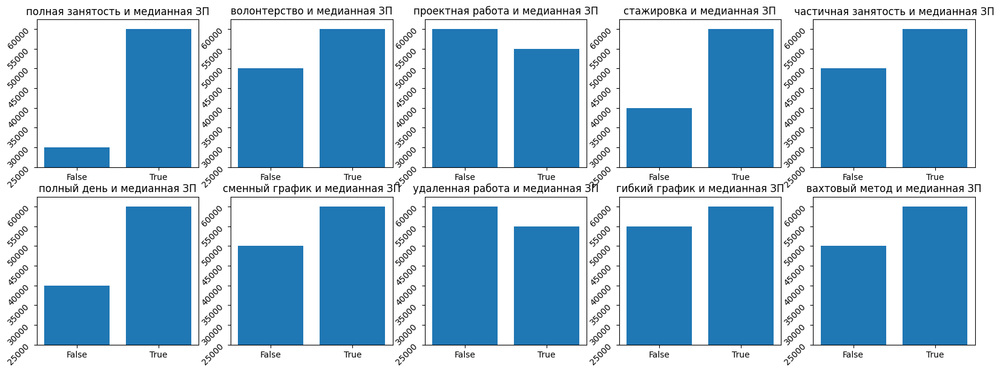

In [35]:
#визуализация систем координат 
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20,7))
#столбчатая диаграмма
axes[1 , 0].bar(x = list(hh_df['полный день'].value_counts().sort_values().index), 
            height=[hh_df[hh_df['полный день'] ==  False]['ЗП (руб)'].median() , hh_df[hh_df['полный день'] ==  True]['ЗП (руб)'].median()])
axes[1 , 0].set_title('полный день и медианная ЗП')
axes[1 , 0].set_xticks([ 0 , 1])
axes[1 , 0].set_xticklabels([ "False" ,"True"])
axes[1 , 0].set_ylim([25000,62500])
axes[1 , 0].yaxis.set_tick_params(rotation=45)

axes[1 , 1].bar(x = list(hh_df['сменный график'].value_counts().sort_values().index), 
            height=[hh_df[hh_df['сменный график'] ==  False]['ЗП (руб)'].median() , hh_df[hh_df['сменный график'] ==  True]['ЗП (руб)'].median()])
axes[1 , 1].set_title('сменный график и медианная ЗП')
axes[1 , 1].set_xticks([ 0 , 1])
axes[1 , 1].set_xticklabels([ "False" ,"True"])
axes[1 , 1].set_ylim([25000,62500])
axes[1 , 1].yaxis.set_tick_params(rotation=45)

axes[1 , 2].bar(x = list(hh_df['удаленная работа'].value_counts().sort_values().index), 
            height=[hh_df[hh_df['удаленная работа'] ==  False]['ЗП (руб)'].median() , hh_df[hh_df['удаленная работа'] ==  True]['ЗП (руб)'].median()])
axes[1 , 2].set_title('удаленная работа и медианная ЗП')
axes[1 , 2].set_xticks([ 0 , 1])
axes[1 , 2].set_xticklabels([ "False" ,"True"])
axes[1 , 2].set_ylim([25000,62500])
axes[1 , 2].yaxis.set_tick_params(rotation=45)

axes[1 , 3].bar(x = list(hh_df['гибкий график'].value_counts().sort_values().index), 
            height=[hh_df[hh_df['гибкий график'] ==  False]['ЗП (руб)'].median() , hh_df[hh_df['гибкий график'] ==  True]['ЗП (руб)'].median()])
axes[1 , 3].set_title('гибкий график и медианная ЗП')
axes[1 , 3].set_xticks([ 0 , 1])
axes[1 , 3].set_xticklabels([ "False" ,"True"])
axes[1 , 3].set_ylim([25000,62500])
axes[1 , 3].yaxis.set_tick_params(rotation=45)

axes[1 , 4].bar(x = list(hh_df['вахтовый метод'].value_counts().sort_values().index), 
            height=[hh_df[hh_df['вахтовый метод'] ==  False]['ЗП (руб)'].median() , hh_df[hh_df['вахтовый метод'] ==  True]['ЗП (руб)'].median()])
axes[1 , 4].set_title('вахтовый метод и медианная ЗП')
axes[1 , 4].set_xticks([ 0 , 1])
axes[1 , 4].set_xticklabels([ "False" ,"True"])
axes[1 , 4].set_ylim([25000,62500])
axes[1 , 4].yaxis.set_tick_params(rotation=45)

axes[0 , 0].bar(x = list(hh_df['полная занятость'].value_counts().sort_values().index), 
            height=[hh_df[hh_df['полная занятость'] ==  False]['ЗП (руб)'].median() , hh_df[hh_df['полная занятость'] ==  True]['ЗП (руб)'].median()])
axes[0 , 0].set_title('полная занятость и медианная ЗП')
axes[0 , 0].set_xticks([ 0 , 1])
axes[0 , 0].set_xticklabels([ "False" ,"True"])
axes[0 , 0].set_ylim([25000,62500])
axes[0 , 0].yaxis.set_tick_params(rotation=45)

axes[0 , 1].bar(x = list(hh_df['волонтерство'].value_counts().sort_values().index), 
            height=[hh_df[hh_df['волонтерство'] ==  False]['ЗП (руб)'].median() , hh_df[hh_df['волонтерство'] ==  True]['ЗП (руб)'].median()])
axes[0 , 1].set_title('волонтерство и медианная ЗП')
axes[0 , 1].set_xticks([ 0 , 1])
axes[0 , 1].set_xticklabels([ "False" ,"True"])
axes[0 , 1].set_ylim([25000,62500])
axes[0 , 1].yaxis.set_tick_params(rotation=45)

axes[0 , 2].bar(x = list(hh_df['проектная работа'].value_counts().sort_values().index), 
            height=[hh_df[hh_df['проектная работа'] ==  False]['ЗП (руб)'].median() , hh_df[hh_df['проектная работа'] ==  True]['ЗП (руб)'].median()])
axes[0 , 2].set_title('проектная работа и медианная ЗП')
axes[0 , 2].set_xticks([ 0 , 1])
axes[0 , 2].set_xticklabels([ "False" ,"True"])
axes[0 , 2].set_ylim([25000,62500])
axes[0 , 2].yaxis.set_tick_params(rotation=45)

axes[0 , 3].bar(x = list(hh_df['стажировка'].value_counts().sort_values().index), 
            height=[hh_df[hh_df['стажировка'] ==  False]['ЗП (руб)'].median() , hh_df[hh_df['стажировка'] ==  True]['ЗП (руб)'].median()])
axes[0 , 3].set_title('стажировка и медианная ЗП')
axes[0 , 3].set_xticks([ 0 , 1])
axes[0 , 3].set_xticklabels([ "False" ,"True"])
axes[0 , 3].set_ylim([25000,62500])
axes[0 , 3].yaxis.set_tick_params(rotation=45)

axes[0 , 4].bar(x = list(hh_df['частичная занятость'].value_counts().sort_values().index), 
            height=[hh_df[hh_df['частичная занятость'] ==  False]['ЗП (руб)'].median() , hh_df[hh_df['частичная занятость'] ==  True]['ЗП (руб)'].median()])
axes[0 , 4].set_title('частичная занятость и медианная ЗП')
axes[0 , 4].set_xticks([ 0 , 1])
axes[0 , 4].set_xticklabels([ "False" ,"True"])
axes[0 , 4].set_ylim([25000,62500])
axes[0 , 4].yaxis.set_tick_params(rotation=45)


### _Выводы по графику:_
_Прослеживается яркая взаимосвязь медианной зарплаты и наличия таких признаков как "полная занятость", "частичная занятость" ,"волонтерство", "стажировка", "полный день", "вахтовый метод", "сменный график"._

# Очистка данных

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [27]:
hh_df2 = hh_df.copy() # хочу оставить старое имя
hh_df = hh_df2.drop_duplicates() # чистим от дупликатов
print(hh_df2.shape[0] - hh_df.shape[0])


161


2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

Опыт работы (месяц)                168
Опыт работы (год)                  168
Последняя/нынешняя должность         2
Последнее/нынешнее место работы      1
dtype: int64

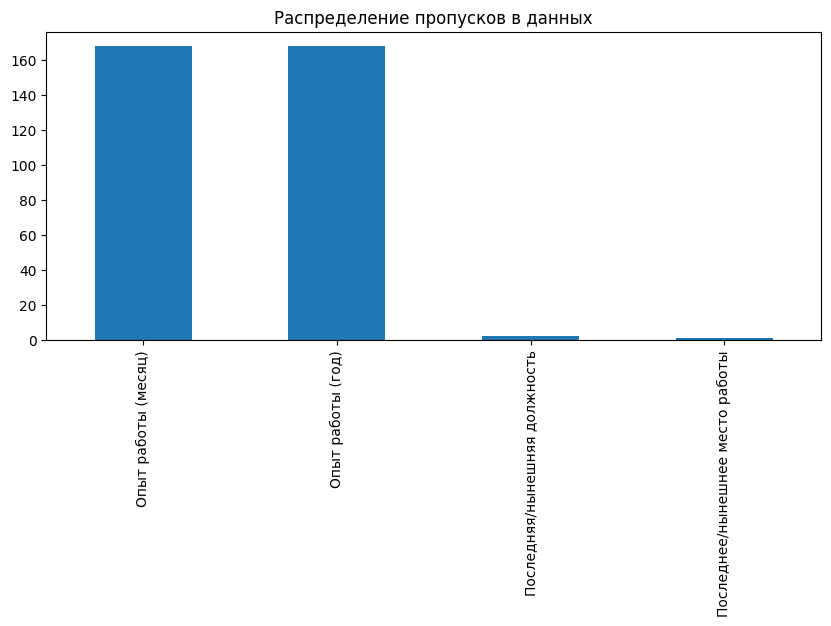

In [28]:
# Умножаем на 100 %, находим столбцы, где доля пропусков больше 0, сортируем по убыванию и выводим результат:

cols_null = hh_df.isnull().sum()
cols_with_null = cols_null[cols_null>0].sort_values(ascending=False)
display(cols_with_null)

# Можно воспользоваться столбчатой диаграммой, чтобы визуально оценить соотношение числа пропусков к числу записей.
# Самый быстрый способ построить её — использовать метод plot():
cols_with_null.plot(
    kind='bar',
    figsize=(10, 4),
    title='Распределение пропусков в данных'
);

3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [29]:
# **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**

hh_df = hh_df.dropna(how='any', axis=0, subset=["Последнее/нынешнее место работы", "Последняя/нынешняя должность"])
hh_df['Опыт работы (месяц)'] = hh_df['Опыт работы (месяц)'].fillna(hh_df['Опыт работы (месяц)'].median())
display(round(hh_df['Опыт работы (месяц)'].mean()))


114

4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [30]:
mask_over_million = hh_df['ЗП (руб)'] <= 1000000
mask_under_thousand = hh_df['ЗП (руб)'] >= 1000
mask_salary = mask_under_thousand & mask_over_million

hh_df = hh_df[mask_salary]


5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [31]:

mask_work_exp = hh_df['Опыт работы (год)'] < hh_df['Возраст'] 
hh_df = hh_df[mask_work_exp]

6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

Число выбросов по методу z-отклонения: 3
Результирующее число записей: 44316


15     2
100    1
Name: Возраст, dtype: int64

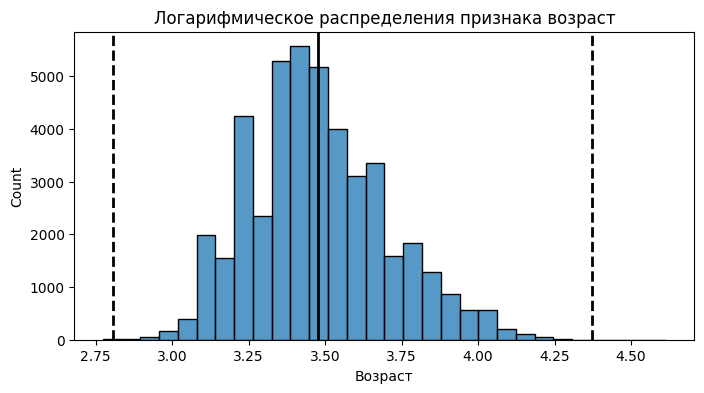

In [32]:
def outliers_z_score_mod(data, feature, left = 3, right = 3, log_scale=False):
    if log_scale:
        x = np.log(data[feature]+1)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned

fig, ax = plt.subplots(1, 1, figsize=(8, 4))
log_age = np.log(hh_df['Возраст'] +1)
histplot = sns.histplot(log_age, bins=30, ax=ax)
histplot.axvline(log_age.mean(), color='k', lw=2)
histplot.axvline(log_age.mean()+ 4 *log_age.std(), color='k', ls='--', lw=2)
histplot.axvline(log_age.mean()- 3 *log_age.std(), color='k', ls='--', lw=2)
histplot.set_title('Логарифмическое распределения признака возраст');

outliers, cleaned = outliers_z_score_mod(hh_df, 'Возраст',left=3, right=4, log_scale=True )
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

outliers['Возраст'].value_counts().sort_index()

_По данному критерию очищена таблица от соискателей с возрастом 15 лет и менее и 100 лет и более. (по моему imho сдедовало сделать очистку без логарифмической шкалы, мы бы потеряли 81 запись соискателей с возрастом 64+, что вряд ли бы сильно сказалось на систему рекомендаций)_